<a href="https://colab.research.google.com/github/ajiggody/Dog-Breed-Classification-/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# end-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 & TensorflowHub

## 1. Problem

Identifying the breed of a dog given an image of the dog.

When I'm sitting at the cafe & I take a picture of the dog, I want to know what breed the dog is.

## 2. Data

The data we're using is from Kaggle's Dog Breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification

## 3. Evaluation

Evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:

* We're dealing with images (unstructured data) so it's probably best we use Deep Learning/Transfer Learning
* There are 120 different breeds of dogs so there are 120 different classes
* There are 10,000+ images in the training set (these images have labels)
* There are 10,000+ images in the test set (these images have no labels because we want to predict them)

In [ ]:
#unzip the unloaded data into Google Drive
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision"

### Get our workspace ready


*   Import TensorFlow - get the data ready (make Tensors)
*   Import TensorFlow Hub (picking models to use on the Tensors)
*   Make sure to use GPU (for more storage on bigger data files/quicker calculations)







In [ ]:
#Import TensorFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.12.0


In [ ]:
#Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

#Check for GPU availability
print("GPU", "available (YESSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.12.0
TF Hub version: 0.14.0
GPU available (YESSS!!!!)


## Getting our data ready (turning in to Tensors)

With all Machine Learning models our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data & checking out the labels.

In [ ]:
#Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

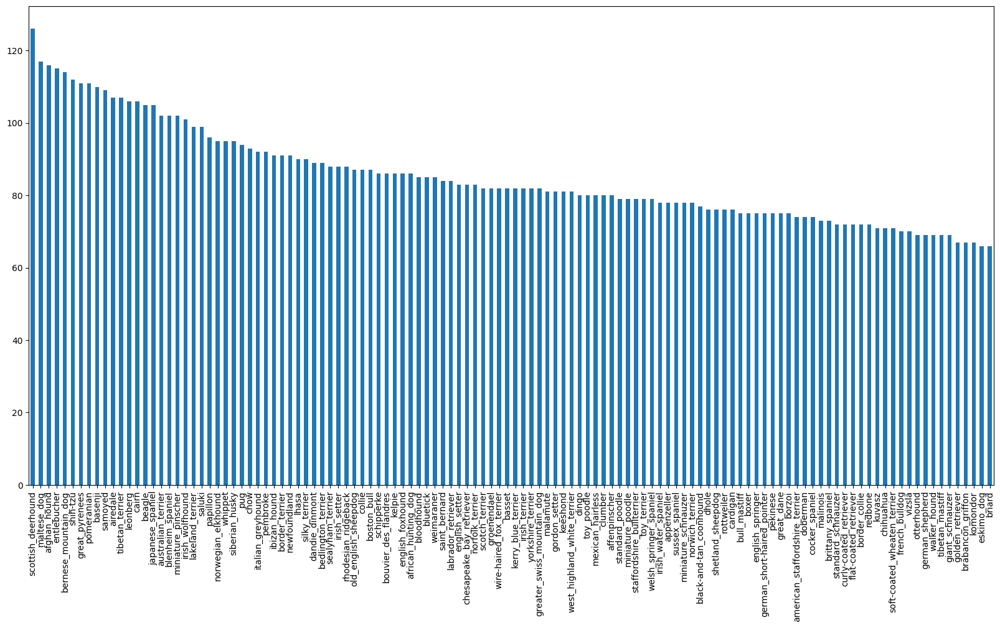

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
#labels_csv["breed"].value_counts().median()

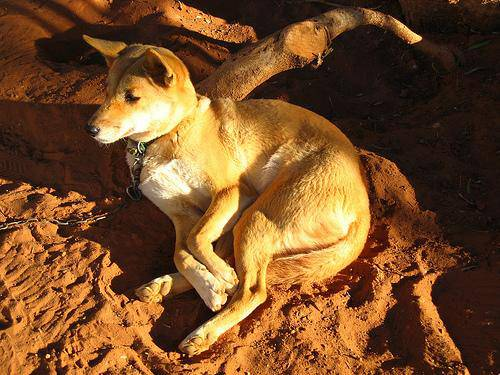

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images & their labels

Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/"+ fname + ".jpg" for fname in labels_csv["id"]]

#Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#Check whether or not filenames matches the # of image files
import os #good for accessing and/or modifying files and directories - in this case checking to see if the filenames were properly in our folders
os.listdir("drive/MyDrive/Dog Vision/train/")[:10]

['e12986379661597e7c287008c89f4ea6.jpg',
 'de2b37e3a9b09388de6fac2872acfac4.jpg',
 'df775558457f8fc42f50a1b944d89328.jpg',
 'db84277a5adca6b4a349396f6070287f.jpg',
 'dc9e5324fa4d1b4cdeede9b031d3fdf1.jpg',
 'e779a2c3d07afb0056a1e33298e9eecf.jpg',
 'dfbeabe922f09fa99ce84c6a94210279.jpg',
 'de14c220f31820f5c9e13ee876d95a8a.jpg',
 'e466e0a3b43403c7bffd943fffc92ced.jpg',
 'df4d0576d927992df06c9bb08bb9bac7.jpg']

In [ ]:
#Check whether or not filenames matches the # of image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames does not match actual amount of files, check directory.")

Filenames match actual amount of files!!! Proceed.


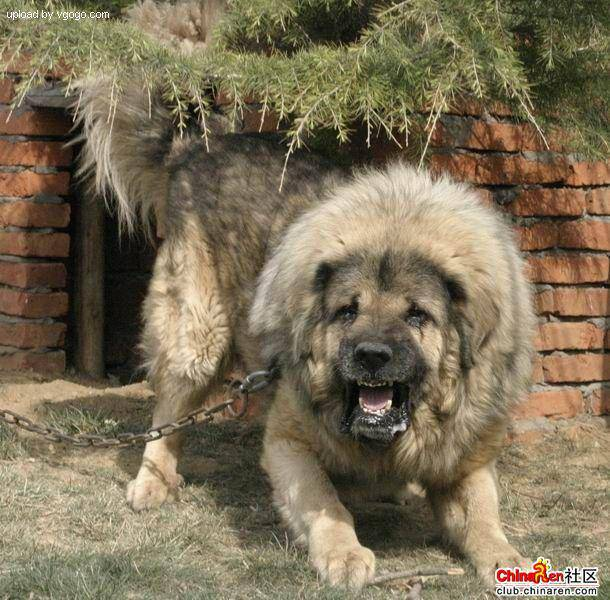

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) #does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches # of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match # of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
#Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of Booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a Boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning Boolean arrays into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) #index - where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in Boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own Validation Set
Since the dataset from Kaggle does not come with a valdiation set we're going to create our own.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off experimenting ~1000 images and then increase as needed

In [ ]:
#Set # of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1, max:1000}

In [ ]:
# Let's split our data into train & validation sets
from sklearn.model_selection import train_test_split

np.random.seed(42)

# Split them into training & validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_train), len(y_val)

(800, 800, 800, 200)

In [ ]:
#Let's have a gaze at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors, we're going to right a function that does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file & save it to a variable
3. Turn our `image` a (jpg.) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

In [ ]:
#Convert an image to a Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
#turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.
1. Take an image filepath as input
2. Use Tensorflow to read the file & save it to a variable, `image `
3. Turn our `image` a (jpg.) into Tensors
4. Normalize our `image` (convert colour channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

In [ ]:
#Define Image size
IMG_SIZE = 224

#Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path & turns the image into a Tensor.
  """
  #Read it an image file
  image = tf.io.read_file(image_path)

  #Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize the image to our desired value(224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  preprocess the image & return a type of tuple (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
#Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our tuples into Tensors in the form:(`image``label`), let's make a function to turn all of our data (`X`, `y`) into batches.

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

#Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's `training` data but doesn't shuffle if it's `validation` data.
  Also accepts test data as input (no labels).
  """
  #If the data is a test dataset we, we don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE) #there are no labels (y - data) on the test data
    return data_batch

  #If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    #Turn filepaths & labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

  #Shuffling pathnames & labels before mapping image processor function is faster than shuffling
  data = data.shuffle(buffer_size=len(X))

  #Create (image, label) tuples (this also turns the image path into into a preprocesed image)
  data = data.map(get_image_label)

  #Turn the training data into batches
  data_batch = data.batch(BATCH_SIZE)

  return data_batch


In [ ]:
#Create training & Validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val)

Creating training data batches...
Creating training data batches...


In [ ]:
#Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data batches

Our data is now in batches, however, these can be a little hard to comprehend. Let's visualize them.


In [ ]:
import matplotlib.pyplot as plt

#Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images & their labels from a data batch
  """
  #Set up the figure
  plt.figure(figsize=(10,10))
  #Loop through 25 (for displaying 25 images)
  for i in range(25):
    #Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")


In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

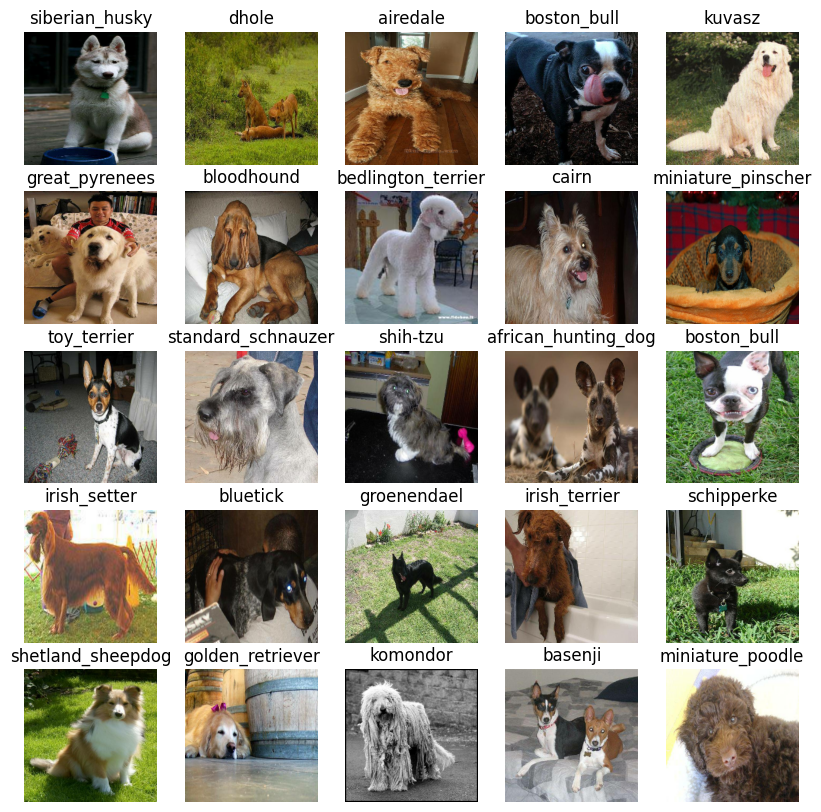

In [ ]:
#Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

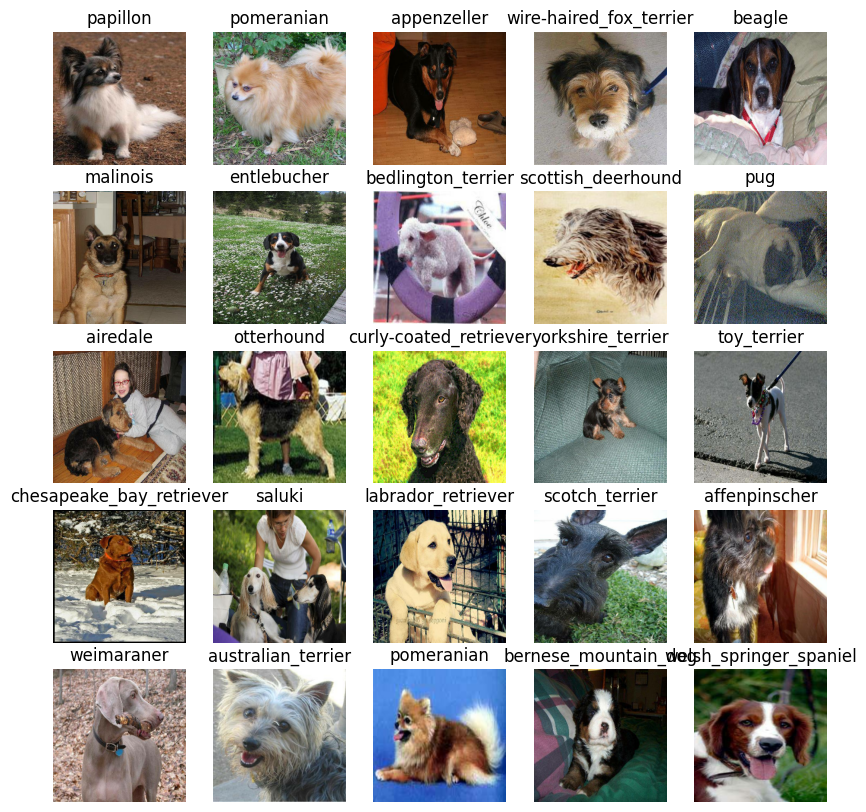

In [ ]:
#Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:

* Input shape (our images shape, in the form of Tensors) to our model ✅
* The output shape (image labels in the form of Tensors) of our model ✅
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5 ✅



In [ ]:
IMG_SIZE

224

In [ ]:
#Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#Setup URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs, & model ready to go let's put them together into a keras Deep Learning Model.

Knowing this let's create a function which:
* Takes the input shape, output shape, & model we've chose as parameters ✅
* Defines the layer of a keras model in a sequential fashion (do a, then do b, then do c.) ✅
* Compiles the model (says how it should be evaluated & improved) ✅
* Builds the model (tells the model the input shape it'll be getting) ✅
* Returns the model ✅

All of these steps can be found here - https://www.tensorflow.org/guide/keras

In [ ]:
#Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  #Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer 1 (input layer) - finding the patterns within the images provided
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") #Layer 2 (output layer) - converts the image sizes to our own output shape
    ])

  #Compile the model
  model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(), #loss is measure of how well model is guessing / higher the loss - the worse the the model is doing, lower the loss the better
        optimizer=tf.keras.optimizers.Adam(), #telling us how to lower the loss function / Adam Optimizer performs well on most models
        metrics = ["accuracy"] #evaluating the guesses after it's learned
    )

  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1, 1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

### Creating callbacks

Callbacks are helper functions used during training a model. They can save a model's progress, check it's progress, or stop training a model early if it isn't improving.

We're going to create callbacks, one for TensorBoard which trakcs the model's progress & another for early stopping which prevents our model for training for too long.

### TensorBoard callback

To setup a TensorBoard callback we need to setup 3 things:
1. Load TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory & pass it to our model's `fit()` function ✅
3. Visualize our model's training board with the `%tensorboard` magic function (we'll do after this model training). ✅

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/Logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
create_tensorboard_callback()

### Early stopping callback

Helps stop our model from over fitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
#Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min: 10, max: 100, step:10}


In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available (yes!)" if tf.config.list_physical_devices("GPU") else "not available :(")


GPU available (yes!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it to the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train & return a trained model
def train_model():
  """
  Trains a given model & returns the trained version
  """
  #Create a model
  model = create_model()


  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  # Return the fitted model
  return model


In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 123s 3s/step - loss: 4.5952 - accuracy: 0.0962 - val_loss: 3.3905 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 3s 125ms/step - loss: 1.6459 - accuracy: 0.6775 - val_loss: 2.1865 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 3s 126ms/step - loss: 0.5741 - accuracy: 0.9337 - val_loss: 1.6415 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 4s 168ms/step - loss: 0.2529 - accuracy: 0.9862 - val_loss: 1.4993 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 3s 125ms/step - loss: 0.1494 - accuracy: 0.9962 - val_loss: 1.4291 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 3s 127ms/step - loss: 0.1030 - accuracy: 0.9987 - val_loss: 1.3817 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================]

**Question:** It looks look like our model is overfitting becauss it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in Deep Learning neurla networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!

### Checking the TensorBoard logs

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier & visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/Logs --port 6012

<IPython.core.display.Javascript object>

### Making & evaluating predictions using a trained model



In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used)
predictions = model.predict(val_data, verbose=1) #verbose - when making predictions, its showing us the progress
predictions

7/7 [==============================] - 1s 101ms/step


array([[3.64593649e-03, 3.48995090e-03, 1.85585755e-04, ...,
        3.25060246e-04, 1.25304388e-04, 2.24915341e-01],
       [5.03430003e-03, 4.16519004e-04, 5.01606046e-05, ...,
        3.49982474e-05, 1.48018643e-01, 3.34786549e-02],
       [2.80226250e-05, 3.51444964e-04, 2.01724615e-04, ...,
        2.00722337e-01, 1.45540471e-04, 1.73075867e-04],
       ...,
       [1.43825344e-03, 7.57062924e-04, 3.03830532e-03, ...,
        9.89092048e-04, 4.60664416e-03, 7.82602219e-05],
       [2.84125470e-03, 5.28669159e-04, 7.32824381e-04, ...,
        4.86843362e-02, 2.23224657e-03, 4.31699166e-03],
       [7.63947526e-07, 1.27460240e-04, 9.52691555e-01, ...,
        1.15116265e-04, 1.95717425e-04, 6.98665681e-05]], dtype=float32)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
#First predictions
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}") #the higher this number, the more confident a model is at a certain prediction
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.90085566e-04 7.58651804e-05 1.72008571e-04 1.18260345e-04
 4.48342878e-03 8.66719129e-05 1.26976272e-04 5.17449167e-04
 6.97968435e-03 5.70274517e-02 4.63925790e-05 3.44609143e-05
 2.47401127e-04 2.24427693e-03 2.27880944e-03 3.40337865e-03
 3.87240216e-05 7.45626807e-04 1.73335648e-04 5.69789612e-04
 7.05109560e-05 2.97047140e-04 2.09204663e-05 8.00122361e-05
 4.18082112e-03 3.62851541e-04 6.52649251e-05 3.10758303e-04
 6.81393649e-05 8.72383898e-05 1.93472995e-04 1.25371822e-04
 9.08549555e-05 4.92047729e-05 4.55465779e-05 4.08255437e-05
 8.32781196e-04 3.46276298e-04 4.49551917e-05 2.26557955e-01
 4.25721228e-04 9.81856356e-05 1.03749381e-03 1.32717332e-05
 4.39060619e-04 8.38920241e-05 1.79355615e-04 1.29513186e-03
 1.10846977e-05 4.40686359e-04 1.30902263e-04 1.31845940e-04
 4.39043011e-04 5.54358680e-03 4.56851994e-04 2.46459851e-04
 2.94684112e-04 9.41819308e-05 9.03052060e-05 5.55552033e-05
 2.39156900e-04 5.43770671e-04 1.17423369e-05 3.98077791e-05
 3.29253875e-04 2.324835

In [ ]:
unique_breeds[18]

'borzoi'

Having the above functionality is great but we want to be able to do it at scale.

It would be even better if we could see the image the prediction is being made on!

**Note!** Prediction probabilities also known as confidence levels




In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities

pred_label = get_pred_label(predictions[81])
pred_label

'pug'

Now since our validation data is still in a batch dataset(efficient for the use of TensorFlow to make calculations on),
we'll have to unbatch it to make predictions on the validation images & then compare those predictions to the validation truth labels.


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a dataset
def unbatchify(data):
  """
  Takes a batch data set of (image,label) Tensors & returns separate arrays of images & labels.
  """
  images = []
  labels = []
  #Loop through unbatch data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

#Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.28285113, 0.24363545, 0.28559706],
         [0.31342006, 0.27420437, 0.315723  ],
         [0.3080526 , 0.26891357, 0.3000561 ],
         ...,
         [0.20033932, 0.24347658, 0.1186166 ],
         [0.28769165, 0.37302098, 0.24241866],
         [0.2302658 , 0.331051  , 0.19438386]],
 
        [[0.17890245, 0.13968675, 0.17403072],
         [0.3055649 , 0.26634923, 0.29953694],
         [0.30044007, 0.26153952, 0.29196668],
         ...,
         [0.2197907 , 0.26865274, 0.14905757],
         [0.29777807, 0.3773826 , 0.25536746],
         [0.24036151, 0.33000228, 0.20375046]],
 
        [[0.37706405, 0.3443172 , 0.36137778],
         [0.3812126 , 0.34846574, 0.36552632],
         [0.3514176 , 0.31867078, 0.33573133],
         ...,
         [0.2933075 , 0.3529801 , 0.23310968],
         [0.28925145, 0.36253345, 0.24683838],
         [0.24217941, 0.31747925, 0.2008738 ]],
 
        ...,
 
        [[0.4575711 , 0.5201238 , 0.3652128 ],
         [0.20018499, 0.2399548 , 0.13898

Now we've got ways to get:
* Prediction Labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels, & an array of images & integers. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label , its predicted probabilitty, the truth label, & the target image on a single plot. ✅


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth, & the image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #Change plot title to be predicted, probability od prediction & truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

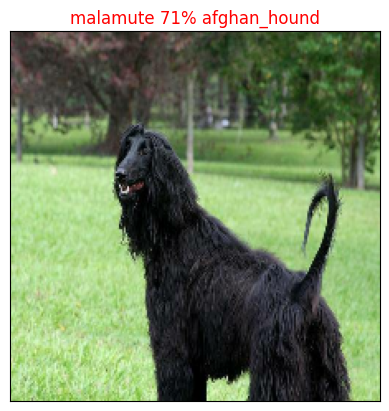

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=82)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities & a ground truth array & an integer✅
* Find the prediction using `get_pred_label()` ✅
* Find the top 10:
  * Prediction probability indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values & labels, coloring the true label green ✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences (how likely the predictions of an ML algo are correct) alogn with the truth label & sample n
  """
  pred_prob, true_label =  prediction_probabilities[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  #Change the color of the true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


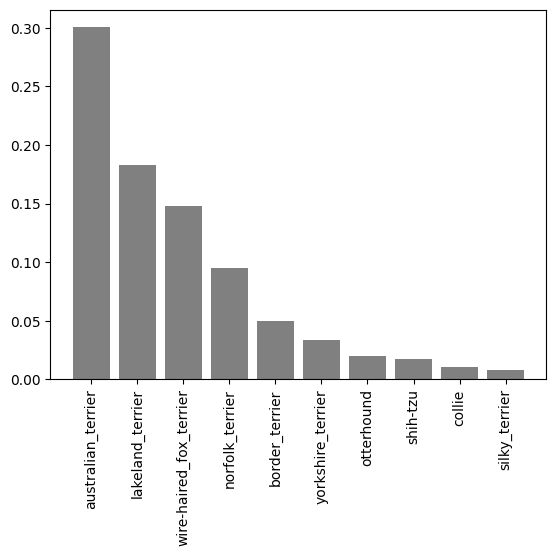

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=1)

Now we've got some functions to help us visualize our predictions & evaluate our model, let's check out a few.

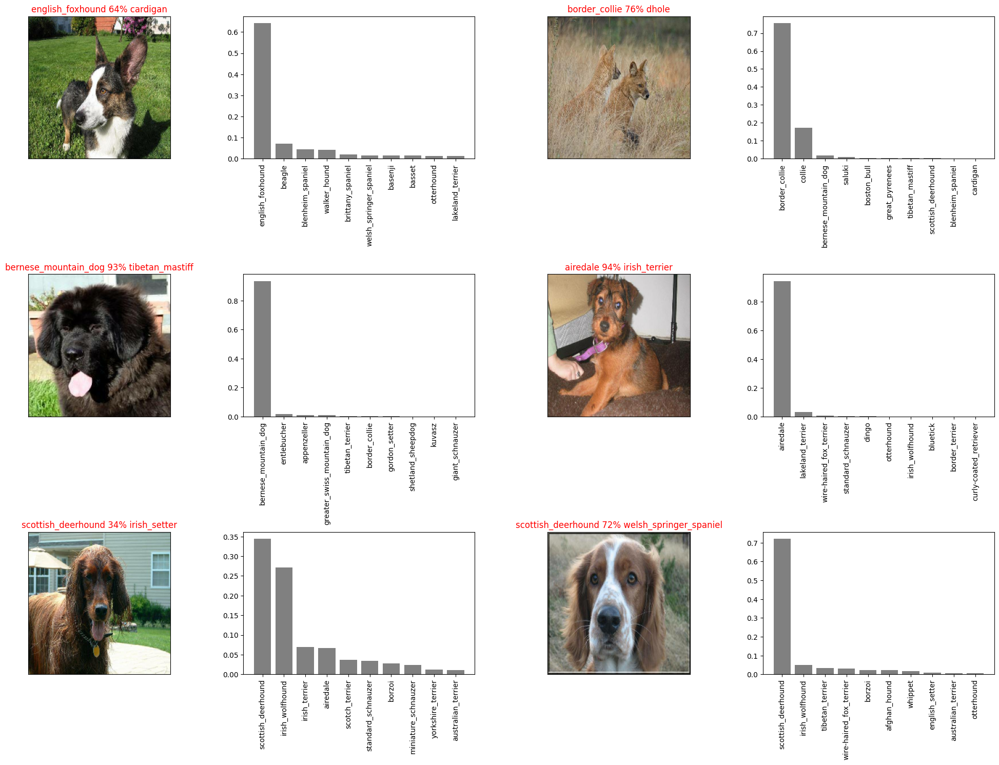

In [ ]:
#Let's check out a few predictions & their values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0) # adjusts the layout of the plot below
plt.show()

**Challenge:** How would you create a confusion matrix with our model's predictions & true labels?


##Saving & reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model's directory & appends a suffix (string).
  """

  #Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #save format of model
  print(f"Saving model to:{model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading a saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save & load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to:drive/MyDrive/Dog Vision/Models/20230818-22481692398897-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/Models/20230818-22481692398897-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/Models/20230814-17441692035047-1000-images-mobilenetv2-Adam.h5")

Loading a saved model from: drive/MyDrive/Dog Vision/Models/20230814-17441692035047-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 142ms/step - loss: 1.3190 - accuracy: 0.6550


[1.3190056085586548, 0.6549999713897705]

In [ ]:
#Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 160ms/step - loss: 1.3435 - accuracy: 0.6250


[1.3434991836547852, 0.625]

##Training a big dog model 🐶 (on full data set)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
#Create a databatch with the full data set
full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below may take while (maybe up to 30 minutes for the first epoch) because the GPU in the runtime has to upload all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 42s 119ms/step - loss: 1.3277 - accuracy: 0.6692
Epoch 2/100
320/320 [==============================] - 36s 111ms/step - loss: 0.3974 - accuracy: 0.8866
Epoch 3/100
320/320 [==============================] - 36s 111ms/step - loss: 0.2354 - accuracy: 0.9355
Epoch 4/100
320/320 [==============================] - 37s 116ms/step - loss: 0.1524 - accuracy: 0.9653
Epoch 5/100
320/320 [==============================] - 36s 112ms/step - loss: 0.1056 - accuracy: 0.9794
Epoch 6/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0779 - accuracy: 0.9858
Epoch 7/100
320/320 [==============================] - 36s 113ms/step - loss: 0.0590 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0447 - accuracy: 0.9952
Epoch 9/100
320/320 [==============================] - 36s 112ms/step - loss: 0.0371 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 38s 118m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to:drive/MyDrive/Dog Vision/Models/20230818-23081692400111-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/Models/20230818-23081692400111-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
#Load in full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/Models/20230814-18441692038673-full-image-set-mobilenetv2-Adam.h5")

Loading a saved model from: drive/MyDrive/Dog Vision/Models/20230814-18441692038673-full-image-set-mobilenetv2-Adam.h5


In [ ]:
len(X)

10222

## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input & convert them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames ✅
* Convert the filenames into test data batches using `create_data_batches()` & setting the `test_data()` parameter to `True` (since the test data doesn't have labels). ✅
* Make predictions array by passing test data batches to the `predict()` method called on our model.✅


In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e59d59ffbb65d9eae166d4068af5d9b9.jpg',
 'drive/MyDrive/Dog Vision/test/e01a1ea716359e2f0062aca591ff9ca4.jpg',
 'drive/MyDrive/Dog Vision/test/e145bbebb9ad1e740256e460899a6b67.jpg',
 'drive/MyDrive/Dog Vision/test/e292584f17fa7cea7f95bdadecde0ebb.jpg',
 'drive/MyDrive/Dog Vision/test/e2537e98808877c707bfe8ca53e303b7.jpg',
 'drive/MyDrive/Dog Vision/test/e715a411098c046cac90c3facfa58c77.jpg',
 'drive/MyDrive/Dog Vision/test/e64d56f012476f124591a22648114a37.jpg',
 'drive/MyDrive/Dog Vision/test/e800b6c8d2904e205d67ada800907762.jpg',
 'drive/MyDrive/Dog Vision/test/e0a21cb0d8d3014b6c56230350a9362f.jpg',
 'drive/MyDrive/Dog Vision/test/e09a3a40b2ebdf0be72800eefd6931de.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model & passing it the test data will take a long time (about an hr).

In [ ]:
# Make predictions on test data batches using the loaded full model   - #had to rerun the code from the beginning where create_data_batches was created & edit the test folder file in order for the model to full be predicted
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 41s 126ms/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",") #delimiter="," is used for csv' files

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[2.20343144e-09, 4.39451990e-12, 7.65983388e-11, ...,
        1.04048289e-11, 3.55159097e-11, 2.18401672e-13],
       [5.72221552e-07, 3.57945074e-09, 3.04949732e-09, ...,
        2.86431399e-11, 1.77486803e-10, 2.64189254e-07],
       [1.66187408e-09, 1.19562316e-08, 1.01167374e-09, ...,
        1.54018387e-09, 2.03752168e-10, 9.40874997e-07],
       ...,
       [1.70231065e-10, 3.78643167e-12, 1.87810031e-10, ...,
        1.43234429e-04, 6.19966158e-08, 6.28107332e-12],
       [8.08398681e-09, 1.45711443e-10, 4.05995168e-11, ...,
        5.71666534e-11, 2.75649021e-15, 4.26098528e-13],
       [7.33125347e-08, 2.48287696e-10, 7.72222197e-09, ...,
        2.80500085e-11, 1.02424602e-09, 1.09760130e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission we find that it wants our model's prediction probability outputs in a dataframe with an ID column & a column for each different dog breed.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataDrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a csv to submit it to Kaggle.

In [ ]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [ ]:
#Create a pandas DataFrame
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog Vision/test/e59d59ffbb65d9eae166d4068af5d9b9', '.jpg')

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e59d59ffbb65d9eae166d4068af5d9b9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e01a1ea716359e2f0062aca591ff9ca4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e145bbebb9ad1e740256e460899a6b67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e292584f17fa7cea7f95bdadecde0ebb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e2537e98808877c707bfe8ca53e303b7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e59d59ffbb65d9eae166d4068af5d9b9,2.203431e-09,4.394520e-12,7.659834e-11,2.506871e-11,1.997361e-10,2.527584e-15,4.820734e-11,4.423309e-10,7.809709e-10,...,3.763143e-08,3.185805e-08,1.440921e-11,4.458817e-14,2.071604e-12,1.611024e-12,1.881013e-10,1.040483e-11,3.551591e-11,2.184017e-13
1,e01a1ea716359e2f0062aca591ff9ca4,5.722216e-07,3.579451e-09,3.049497e-09,1.200843e-07,5.359965e-08,2.992192e-09,6.941038e-07,6.588680e-09,2.321120e-10,...,3.736171e-06,3.389778e-08,8.162849e-07,4.990881e-09,4.407328e-09,2.234480e-09,3.615348e-10,2.864314e-11,1.774868e-10,2.641893e-07
2,e145bbebb9ad1e740256e460899a6b67,1.661874e-09,1.195623e-08,1.011674e-09,1.190546e-08,2.483624e-10,4.245772e-11,1.974742e-11,2.927856e-12,6.734256e-09,...,1.843005e-08,1.624918e-11,3.410993e-06,2.083129e-09,2.198069e-07,3.732141e-09,1.257272e-10,1.540184e-09,2.037522e-10,9.408750e-07
3,e292584f17fa7cea7f95bdadecde0ebb,6.125898e-06,1.451509e-08,1.772953e-08,1.374506e-10,1.406932e-08,2.656655e-11,8.030967e-08,1.583650e-10,4.432757e-10,...,1.392020e-09,1.555580e-08,9.825853e-11,6.815569e-09,7.529462e-11,1.444938e-12,3.715018e-07,9.895210e-12,7.832009e-07,1.142075e-08
4,e2537e98808877c707bfe8ca53e303b7,8.565756e-14,4.888486e-13,3.204972e-15,4.585000e-13,6.089395e-12,1.493089e-14,2.207417e-10,1.215054e-11,3.365345e-13,...,2.799822e-12,5.562741e-15,1.159229e-14,1.603273e-13,3.299899e-14,3.862172e-13,7.669131e-14,1.427090e-14,4.496223e-13,1.540495e-12


In [ ]:
# Save our predictions DataFrame to csv for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make on custom images, we'll:
* Get the file paths of our own images
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass custom image data batch to our model's  `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.


In [ ]:
# Get custom image filepaths - this is for if I wanted to test my model with an image of a dog that I personally took a picture of
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/dog-photo-3.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dog-photo-2.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dog-photo-1.jpeg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 562ms/step


In [ ]:
custom_preds

array([[3.63725849e-09, 3.67246546e-11, 3.84919562e-11, 6.71033507e-10,
        5.74665234e-14, 6.26539098e-11, 3.75648601e-12, 1.24947747e-10,
        1.24941071e-10, 5.51306570e-11, 1.26135595e-11, 7.57899115e-13,
        5.02937176e-08, 2.22588969e-09, 1.30114619e-09, 5.13968347e-11,
        2.51054266e-09, 1.70289638e-09, 2.02045238e-11, 7.73848896e-09,
        3.86032872e-10, 8.18306367e-10, 1.51320387e-06, 6.66415950e-11,
        8.73134291e-12, 2.36284814e-06, 1.51536159e-13, 1.58159011e-12,
        8.14647794e-11, 2.73502576e-09, 4.55773508e-09, 1.60246989e-11,
        4.49179366e-12, 6.67183756e-12, 5.89471041e-11, 2.59956275e-11,
        1.25324241e-12, 1.33038724e-09, 4.27379139e-11, 2.65685074e-09,
        6.65197335e-13, 8.27017830e-14, 1.72525105e-10, 2.44202141e-11,
        3.12661924e-10, 9.86748745e-08, 3.07328607e-11, 2.59546190e-10,
        2.25253469e-10, 7.25615193e-11, 4.22060165e-11, 8.20220072e-11,
        3.42844607e-11, 3.42547206e-11, 1.64771512e-11, 1.105202

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pug', 'siberian_husky', 'german_shepherd']

In [ ]:
# Get custom imagees (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

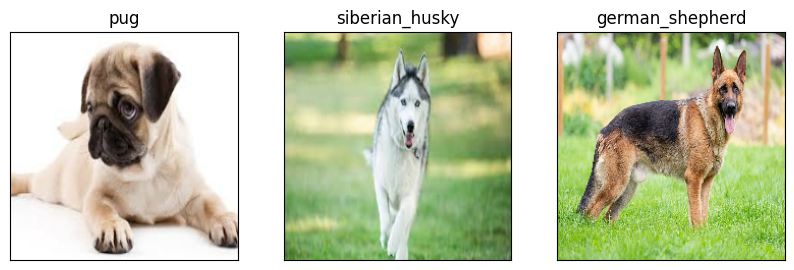

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)